In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
data = pd.read_csv('train.csv')
data.head()

,id,Podcast_Name,Episode_Title,Episode_Length_minutes,Genre,Host_Popularity_percentage,Publication_Day,Publication_Time,Guest_Popularity_percentage,Number_of_Ads,Episode_Sentiment,Listening_Time_minutes
0,0,Mystery Matters,Episode 98,NaN,True Crime,74.81,Thursday,Night,NaN,0.0,Positive,31.41998
1,1,Joke Junction,Episode 26,119.80,Comedy,66.95,Saturday,Afternoon,75.95,2.0,Negative,88.01241
2,2,Study Sessions,Episode 16,73.90,Education,69.97,Tuesday,Evening,8.97,0.0,Negative,44.92531
3,3,Digital Digest,Episode 45,67.17,Technology,57.22,Monday,Morning,78.70,2.0,Positive,46.27824
4,4,Mind & Body,Episode 86,110.51,Health,80.07,Monday,Afternoon,58.68,3.0,Neutral,75.61031


In [3]:
data.shape

(750000, 12)

In [4]:
!pip install scikit-learn
from sklearn.model_selection import train_test_split

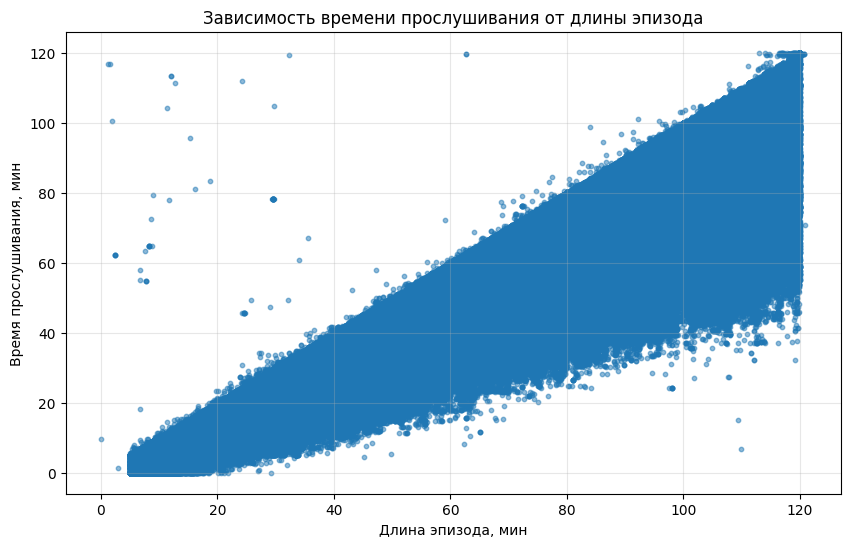

In [5]:
# из прошлого EDA помним о выбросе в Episode_Length_minutes.

filtered_df = data.dropna(subset=['Episode_Length_minutes', 'Listening_Time_minutes']) # Удаляем пропуски в обеих колонках одновременно
filtered_df = filtered_df[filtered_df['Episode_Length_minutes'] < 130] # убрали выброс 325

plt.figure(figsize=(10, 6))
plt.scatter(filtered_df['Episode_Length_minutes'], 
            filtered_df['Listening_Time_minutes'], 
            alpha=0.5, s=10)
plt.title('Зависимость времени прослушивания от длины эпизода')
plt.xlabel('Длина эпизода, мин')
plt.ylabel('Время прослушивания, мин')
plt.grid(True, alpha=0.3)
plt.show()

In [6]:
X = filtered_df[['Episode_Length_minutes']] # предскажем время прослушивания по длине эпизода
y = filtered_df['Listening_Time_minutes']

In [7]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

Text(0, 0.5, 'ListenTime')

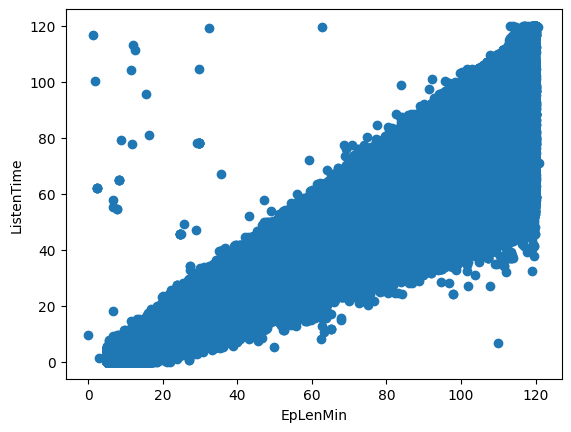

In [8]:
plt.scatter(X_train, y_train)
plt.xlabel("EpLenMin")
plt.ylabel("ListenTime")

In [9]:
from sklearn.linear_model import LinearRegression

lr = LinearRegression()
lr.fit(X_train, y_train)

,"fit_intercept fit_intercept: bool, default=TrueWhether to calculate the intercept for this model. If setto False, no intercept will be used in calculations(i.e. data is expected to be centered).",True
,"copy_X copy_X: bool, default=TrueIf True, X will be copied; else, it may be overwritten.",True
,"tol tol: float, default=1e-6The precision of the solution (`coef_`) is determined by `tol` whichspecifies a different convergence criterion for the `lsqr` solver.`tol` is set as `atol` and `btol` of :func:`scipy.sparse.linalg.lsqr` whenfitting on sparse training data. This parameter has no effect when fittingon dense data... versionadded:: 1.7",1e-06
,"n_jobs n_jobs: int, default=NoneThe number of jobs to use for the computation. This will only providespeedup in case of sufficiently large problems, that is if firstly`n_targets > 1` and secondly `X` is sparse or if `positive` is setto `True`. ``None`` means 1 unless in a:obj:`joblib.parallel_backend` context. ``-1`` means using allprocessors. See :term:`Glossary ` for more details.",None
,"positive positive: bool, default=FalseWhen set to ``True``, forces the coefficients to be positive. Thisoption is only supported for dense arrays.For a comparison between a linear regression model with positive constraintson the regression coefficients and a linear regression without such constraints,see :ref:`sphx_glr_auto_examples_linear_model_plot_nnls.py`... versionadded:: 0.24",False


In [10]:
lr.coef_

array([0.75812653])

In [11]:
lr.intercept_

np.float64(-3.177939421566329)

Визуализируем обучающую выборку

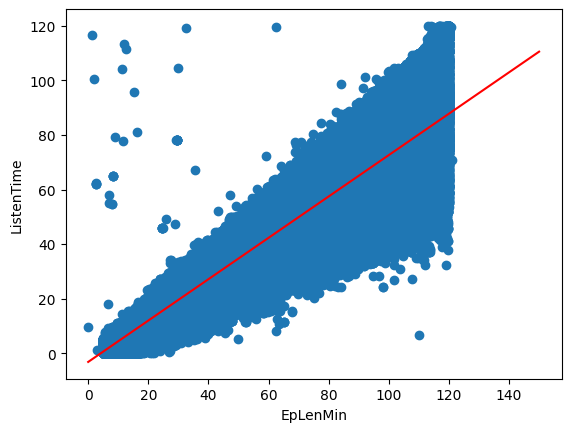

In [12]:
plt.scatter(X_train, y_train)

def f_line(x):
    return lr.coef_ * x + lr.intercept_

x = [0, 150]
y = f_line(x)

plt.plot(x, y, color='red')

plt.xlabel("EpLenMin")
plt.ylabel("ListenTime")

plt.show()

Визуализируем тестовую выборку

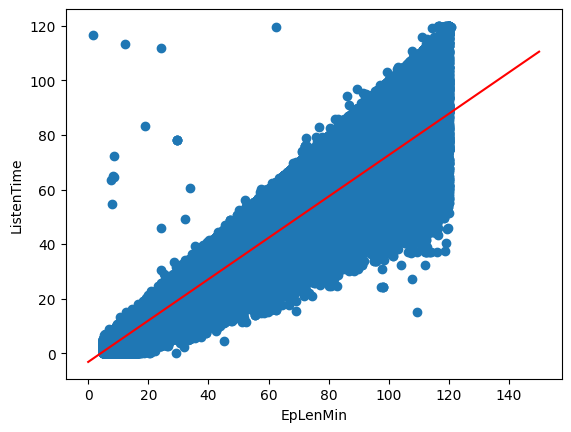

In [13]:
plt.scatter(X_test, y_test)

def f_line(x):
    return lr.coef_ * x + lr.intercept_

x = [0, 150]
y = f_line(x)

plt.plot(x, y, color='red')

plt.xlabel("EpLenMin")
plt.ylabel("ListenTime")

plt.show()

Получаем предсказания на обучающей и тестовой выборках

In [14]:
y_train_predict = lr.predict(X_train)

y_test_predict = lr.predict(X_test)

In [15]:
np.array(y_test) # время в тестовой выбрке - реальные значения!

array([81.27602, 48.77182, 62.72952, ..., 67.85125, 32.73036, 82.3328 ],
      shape=(198872,))

In [16]:
np.array(y_test_predict) # время в предсказанной выбрке

array([72.46034455, 49.95156786, 59.65558745, ..., 71.47478006,
       47.1010121 , 67.08522745], shape=(198872,))

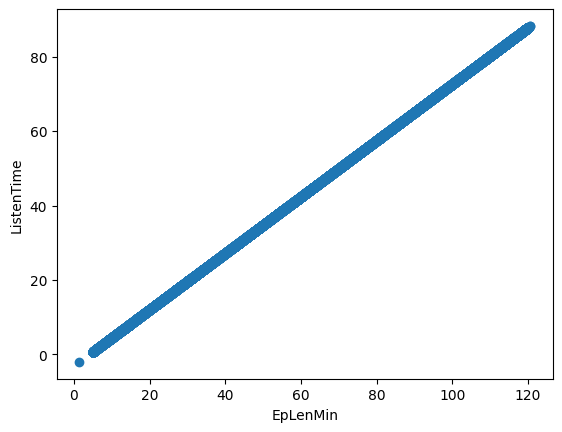

In [17]:
# Визуализируем предсказанные значения

plt.scatter(X_test, y_test_predict)


plt.xlabel("EpLenMin")
plt.ylabel("ListenTime")

plt.show()

In [18]:
# проверим метрики MAE + MSE

from sklearn.metrics import mean_absolute_error, mean_squared_error

In [19]:
mean_absolute_error(y_train, y_train_predict) # из доки: в аргументах функции сначала y_true, потом y_predict, хотя разницы быть и не должно математически

8.382747996817121

In [20]:
mean_absolute_error(y_test, y_test_predict)

8.384102441216202

In [21]:
mean_squared_error(y_train, y_train_predict)

118.5929622295571

In [22]:
mean_squared_error(y_test, y_test_predict)

118.64868758507806

Добавим второй признак - Number_of_Ads

In [23]:
df = data.dropna(subset=['Episode_Length_minutes', 'Listening_Time_minutes', 'Number_of_Ads']) # Удаляем пропуски
df = df[df['Episode_Length_minutes'] < 130] # убрали выбросы
df = df[df['Number_of_Ads'] <= 3] # тут тоже убрали выбросы
X = df[['Episode_Length_minutes', 'Number_of_Ads']] # predict уже по двум признакам
y = df['Listening_Time_minutes']

In [24]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

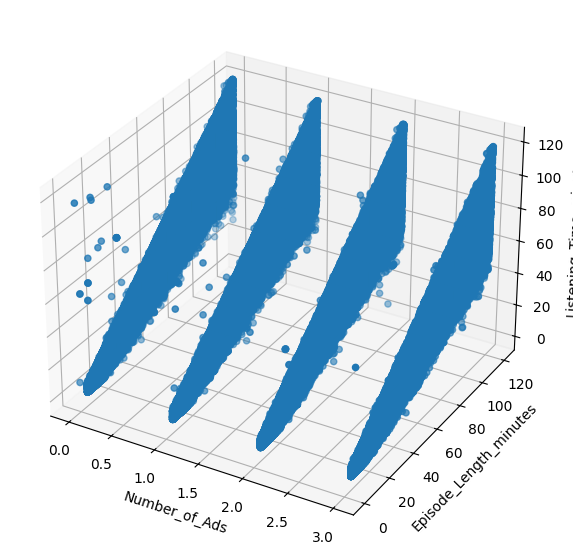

In [25]:
fig = plt.figure(figsize=(7,7))

ax = fig.add_subplot(projection='3d')

x_points = X_train['Number_of_Ads']
y_points= X_train['Episode_Length_minutes']
z_points = y_train

ax.scatter(x_points, y_points, z_points)

ax.set_xlabel("Number_of_Ads")
ax.set_ylabel("Episode_Length_minutes")
ax.set_zlabel("Listening_Time_minutes")

plt.show()

In [26]:
!pip install plotly
import plotly.graph_objects as go
import plotly.offline as py

# Создаём 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(
    x=X_train['Number_of_Ads'],
    y=X_train['Episode_Length_minutes'],
    z=y_train,
    mode='markers',
    marker=dict(
        size=3,
        color=y_train,                # цвет по значению z
        colorscale='Viridis',         # цветовая шкала
        opacity=0.6,
        colorbar=dict(title='Listening_Time')
    )
)])

# Настройки осей и заголовка
fig.update_layout(
    title='Линейная регрессия (2 признака)',
    scene=dict(
        xaxis_title='Number_of_Ads',
        yaxis_title='Episode_Length_minutes',
        zaxis_title='Listening_Time_minutes'
    ),
    width=800,
    height=700
)

py.offline.iplot(fig)

In [27]:
lr = LinearRegression()
lr.fit(X_train, y_train)

y_train_predict = lr.predict(X_train)
y_test_predict = lr.predict(X_test)

assert len(y_train) == len(y_train_predict), "Размеры train не совпадают!"
assert len(y_test) == len(y_test_predict), "Размеры test не совпадают!"

In [28]:
print(lr.coef_)
print(lr.intercept_)

[ 0.7547894  -1.78268792]
-0.541233996439388


# Интерпретация
### Listening_Time = -0.52 + 0.755 × Episode_Length - 1.80 × Number_of_Ads

1) Episode_Length_minutes (coef = +0.755)
    - Длина эпизода на 1 минуту => Время прослушивания увеличивается на 0.755 минуты
    - Чем длиннее эпизод, тем дольше слушают
    - Коэффициент < 1 означает, что люди не дослушивают до конца

2) Number_of_Ads (coef = -1.80)
    - Количество рекламы на 1 => Время прослушивания уменьшается на 1.8 минуты
    - Реклама раздражает, люди выключают
    - Каждая дополнительная реклама "отнимает" ~2 минуты прослушивания

In [29]:
def f_plane(x1, x2):
    return lr.coef_[0] * x1 + lr.coef_[1] * x2 + lr.intercept_

In [30]:
X_train.groupby(['Episode_Length_minutes']).count()

,Number_of_Ads
Episode_Length_minutes,
0.000000,1
1.240000,1
2.470000,2
5.000000,28
5.000064,1
...,...
119.990000,6
120.320000,1
120.370000,2


In [31]:
X_train['Episode_Length_minutes'].min(), X_train['Episode_Length_minutes'].max()

(np.float64(0.0), np.float64(120.73))

In [32]:
X_train.groupby(['Number_of_Ads']).count()

,Episode_Length_minutes
Number_of_Ads,
0.0,133948
1.0,132745
2.0,97867
3.0,99467


In [33]:
X_train['Number_of_Ads'].min(), X_train['Number_of_Ads'].max()

(np.float64(0.0), np.float64(3.0))

Text(0.5, 0, 'Listening_Time_minutes')

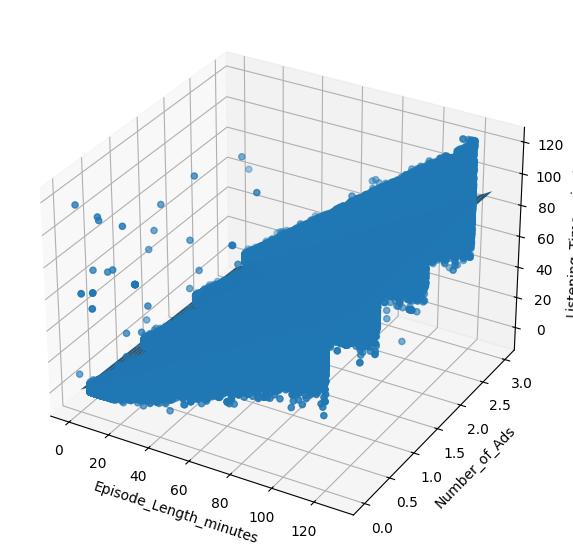

In [34]:
fig = plt.figure(figsize=(7,7))

ax = fig.add_subplot(projection='3d')

x_points= X_train['Episode_Length_minutes']
y_points = X_train['Number_of_Ads']
z_points = y_train

ax.scatter(x_points, y_points, z_points)

x, y  = np.meshgrid(range(0, 130), range(0, 4))
z = np.array([f_plane(point_x, point_y) for point_x, point_y in zip(x, y)])
ax.plot_surface(x, y, z, alpha=0.9)


ax.set_xlabel("Episode_Length_minutes")
ax.set_ylabel("Number_of_Ads")
ax.set_zlabel("Listening_Time_minutes")

In [ ]:
import plotly.graph_objects as go
import plotly.offline as py
import numpy as np

# Данные для точек
x_points = X_train['Episode_Length_minutes']
y_points = X_train['Number_of_Ads']
z_points = y_train

# Создаём сетку для плоскости
x_range = np.linspace(0, 130, 50)
y_range = np.linspace(0, 4, 50)
X, Y = np.meshgrid(x_range, y_range)

# Плоскость регрессии
Z = np.array([f_plane(point_x, point_y) for point_x, point_y in zip(X.flatten(), Y.flatten())])
Z = Z.reshape(X.shape)

# Или если f_plane не работает с массивами, используй коэффициенты напрямую:
# Z = lr.intercept_ + lr.coef_[0] * X + lr.coef_[1] * Y

# Создаём фигуру
fig = go.Figure()

# Точки данных (scatter)
fig.add_trace(go.Scatter3d(
    x=x_points,
    y=y_points,
    z=z_points,
    mode='markers',
    marker=dict(
        size=2,
        color=z_points,
        colorscale='Viridis',
        opacity=0.5
    ),
    name='Данные'
))

# Плоскость регрессии (surface)
fig.add_trace(go.Surface(
    x=x_range,
    y=y_range,
    z=Z,
    opacity=0.7,
    colorscale='Reds',
    showscale=False,
    name='Плоскость регрессии'
))

# Настройки layout
fig.update_layout(
    title='Линейная регрессия (2 признака)',
    scene=dict(
        xaxis_title='Episode_Length_minutes',
        yaxis_title='Number_of_Ads',
        zaxis_title='Listening_Time_minutes',
        xaxis=dict(range=[0, 130]),
        yaxis=dict(range=[0, 4]),
    ),
    width=900,
    height=700
)

py.offline.iplot(fig)

In [ ]:
print(f"MAE train: {mean_absolute_error(y_train, y_train_predict)}")
print(f"MAE test: {mean_absolute_error(y_test, y_test_predict)}")
print(f"MSE train: {mean_squared_error(y_train, y_train_predict)}")
print(f"MSE test: {mean_squared_error(y_test, y_test_predict)}")

MAE train: 8.273362415665472
MAE test: 8.268988232883103
MSE train: 114.64287163011606
MSE test: 114.63706802938772


Обучим по всем признакам

In [ ]:
df.head()

,id,Podcast_Name,Episode_Title,Episode_Length_minutes,Genre,Host_Popularity_percentage,Publication_Day,Publication_Time,Guest_Popularity_percentage,Number_of_Ads,Episode_Sentiment,Listening_Time_minutes
1,1,Joke Junction,Episode 26,119.80,Comedy,66.95,Saturday,Afternoon,75.95,2.0,Negative,88.01241
2,2,Study Sessions,Episode 16,73.90,Education,69.97,Tuesday,Evening,8.97,0.0,Negative,44.92531
3,3,Digital Digest,Episode 45,67.17,Technology,57.22,Monday,Morning,78.70,2.0,Positive,46.27824
4,4,Mind & Body,Episode 86,110.51,Health,80.07,Monday,Afternoon,58.68,3.0,Neutral,75.61031
5,5,Fitness First,Episode 19,26.54,Health,48.96,Saturday,Afternoon,NaN,3.0,Positive,22.77047


In [ ]:
# кодируем классы категориальных признаков в числовые значения

genre_map = {
    'Business': 0,
    'Comedy': 1,
    'Education': 2,
    'Health': 3,
    'Lifestyle': 4,
    'Music': 5,
    'News': 6,
    'Sports': 7,
    'Technology': 8,
    'True Crime': 9
}

day_map = {
    'Monday': 0,
    'Tuesday': 1,
    'Wednesday': 2,
    'Thursday': 3,
    'Friday': 4,
    'Saturday': 5,
    'Sunday': 6
}

time_map = {
    'Morning': 0,
    'Afternoon': 1,
    'Evening': 2,
    'Night': 3
}

sentiment_map = {
    'Negative': 0,
    'Neutral': 1,
    'Positive': 2,
}

# кодируем пропуски как -1

df['Publication_Day_encoded'] = df['Publication_Day'].map(day_map).fillna(-1).astype(int)
df['Sentiment_encoded'] = df['Episode_Sentiment'].map(sentiment_map).fillna(-1).astype(int)
df['Publication_Time_encoded'] = df['Publication_Time'].map(time_map).fillna(-1).astype(int)
df['Genre_encoded'] = df['Genre'].map(genre_map).fillna(-1).astype(int)

num_df = df.select_dtypes(include=['number'])
num_df.head()

,id,Episode_Length_minutes,Host_Popularity_percentage,Guest_Popularity_percentage,Number_of_Ads,Listening_Time_minutes,Publication_Day_encoded,Sentiment_encoded,Publication_Time_encoded,Genre_encoded
1,1,119.80,66.95,75.95,2.0,88.01241,5,0,1,1
2,2,73.90,69.97,8.97,0.0,44.92531,1,0,2,2
3,3,67.17,57.22,78.70,2.0,46.27824,0,2,0,8
4,4,110.51,80.07,58.68,3.0,75.61031,0,1,1,3
5,5,26.54,48.96,NaN,3.0,22.77047,5,2,1,3


In [ ]:
# боремся с NaN
num_df['Guest_Popularity_percentage'] = num_df['Guest_Popularity_percentage'].fillna(0)
num_df.isna().any().any() # проверка на остаток NaN

np.False_

In [ ]:
X = num_df.drop(columns=['Listening_Time_minutes'])
y = num_df['Listening_Time_minutes']
X.head() # проверяем что утечки в обучающей выборке нет

,id,Episode_Length_minutes,Host_Popularity_percentage,Guest_Popularity_percentage,Number_of_Ads,Publication_Day_encoded,Sentiment_encoded,Publication_Time_encoded,Genre_encoded
1,1,119.80,66.95,75.95,2.0,5,0,1,1
2,2,73.90,69.97,8.97,0.0,1,0,2,2
3,3,67.17,57.22,78.70,2.0,0,2,0,8
4,4,110.51,80.07,58.68,3.0,0,1,1,3
5,5,26.54,48.96,0.00,3.0,5,2,1,3


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

In [ ]:
lr = LinearRegression()

lr.fit(X_train, y_train)

y_train_predict = lr.predict(X_train)
y_test_predict = lr.predict(X_test)

In [ ]:
print(f"MAE train: {mean_absolute_error(y_train, y_train_predict)}")
print(f"MAE test: {mean_absolute_error(y_test, y_test_predict)}")
print(f"MSE train: {mean_squared_error(y_train, y_train_predict)}")
print(f"MSE test: {mean_squared_error(y_test, y_test_predict)}")

MAE train: 8.250433202613142
MAE test: 8.25284869443773
MSE train: 113.88800838799126
MSE test: 113.97719724835643


In [ ]:
X_train.head()

,id,Episode_Length_minutes,Host_Popularity_percentage,Guest_Popularity_percentage,Number_of_Ads,Publication_Day_encoded,Sentiment_encoded,Publication_Time_encoded,Genre_encoded
710516,710516,49.32,75.61,78.20,0.0,4,1,2,9
273104,273104,94.08,93.40,0.00,0.0,6,2,3,9
684272,684272,50.22,81.23,71.87,2.0,3,0,3,8
322595,322595,22.48,88.68,55.82,0.0,2,2,2,3
205945,205945,28.87,49.38,97.77,0.0,0,1,2,9


In [ ]:
lr.coef_

array([ 2.08449185e-08,  7.53912452e-01,  3.00541645e-02, -2.86593150e-03,
       -1.78025212e+00,  5.38920130e-03,  5.25025228e-01, -3.21893514e-03,
        7.59293529e-02])

In [ ]:
lr.intercept_

np.float64(-3.068610964733523)

In [ ]:
for i, feature in enumerate(X_train.columns):
    print(feature, ' ' * (22 - len(feature)), '|   ', 'k_'+str(i+1), '  |  ', lr.coef_[i])

id                      |    k_1   |   2.0844918542876905e-08
Episode_Length_minutes  |    k_2   |   0.7539124516687158
Host_Popularity_percentage  |    k_3   |   0.03005416452245273
Guest_Popularity_percentage  |    k_4   |   -0.0028659315015111004
Number_of_Ads           |    k_5   |   -1.7802521181755213
Publication_Day_encoded  |    k_6   |   0.005389201298771647
Sentiment_encoded       |    k_7   |   0.5250252277253215
Publication_Time_encoded  |    k_8   |   -0.0032189351382123617
Genre_encoded           |    k_9   |   0.07592935292695355


1. Number_of_Ads          −1.78  (реклама отпугивает)
2. Episode_Length_minutes  +0.75 (длиннее = дольше слушают)
3. Sentiment_encoded      +0.53 (позитив = дольше слушают)

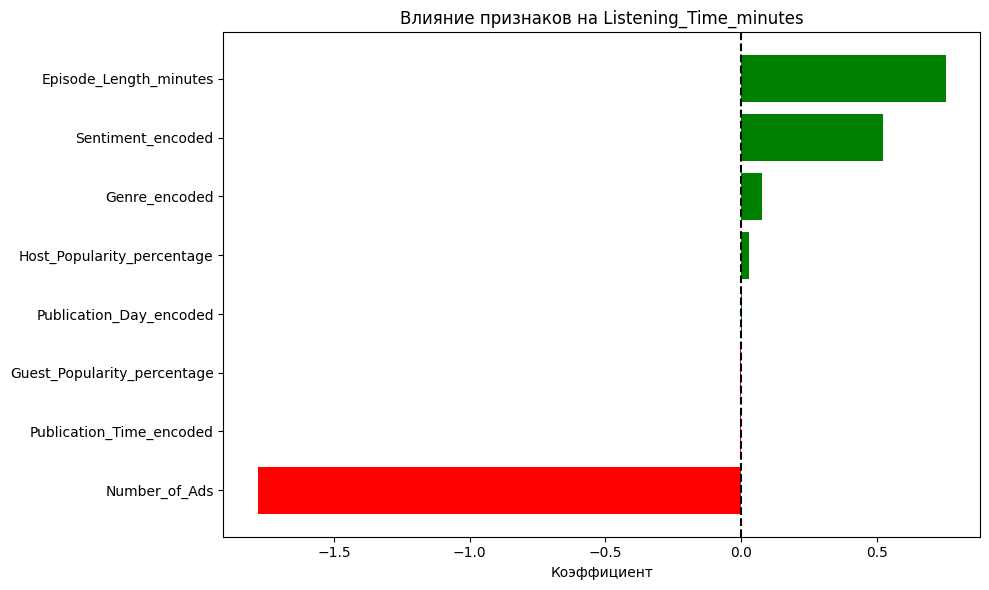

In [ ]:
features = X_train.columns[X_train.columns != 'id'] # убираем id
coefs = [lr.coef_[i] for i, col in enumerate(X_train.columns) if col != 'id']

coef_df = pd.DataFrame({
    'Признак': features,
    'Коэффициент': coefs
}).sort_values('Коэффициент')

plt.figure(figsize=(10, 6))
colors = ['red' if x < 0 else 'green' for x in coef_df['Коэффициент']]
plt.barh(coef_df['Признак'], coef_df['Коэффициент'], color=colors)
plt.xlabel('Коэффициент')
plt.title('Влияние признаков на Listening_Time_minutes')
plt.axvline(x=0, color='black', linestyle='--')
plt.tight_layout()
plt.show()

In [ ]:
# KNN for fun
from sklearn.neighbors import KNeighborsRegressor

knn = KNeighborsRegressor(n_neighbors=5)

knn.fit(X_train, y_train)

y_train_predict_knn = knn.predict(X_train)
y_test_predict_knn = knn.predict(X_test)

print(f"KNN MAE train: {mean_absolute_error(y_train, y_train_predict_knn)}")
print(f"KNN MAE test: {mean_absolute_error(y_test, y_test_predict_knn)}")
print(f"KNN MSE train: {mean_squared_error(y_train, y_train_predict_knn)}")
print(f"KNN MSE test: {mean_squared_error(y_test, y_test_predict_knn)}")

KNN MAE train: 8.92702148480584
KNN MAE test: 11.068608709059733
KNN MSE train: 130.28580715644478
KNN MSE test: 199.20333426844152
